In [130]:
import glob
import os
import re
from dataclasses import dataclass, field
from typing import Dict, Tuple, List

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pydicom
from skimage import exposure, transform
from torch.utils.data import Dataset

In [8]:
DATAPATH = "/ws/rif-net/data/origin/mimic-cxr-2.0.0/"

In [124]:
def imshow(arr, title=None, **kwargs):
    fig = plt.figure(figsize=(16,8))
    plt.imshow(arr, cmap="gray", **kwargs)
    plt.colorbar()
    plt.title(title)
#     plt.axis('off')
    return fig

## Chest radiographs
Chest radiographs were converted from DICOM to a compressed JPG format. First, the image pixels were extracted from the DICOM file using the pydicom library [10]. Pixel values were normalized to the range [0, 255] by subtracting the lowest value in the image, dividing by the highest value in the shifted image, truncating values, and converting the result to an unsigned integer. The DICOM field PhotometricInterpretation was used to determine whether the pixel values were inverted, and if necessary images were inverted such that air in the image appears white (highest pixel value), while the outside of the patient's body appears black (lowest pixel value). The OpenCV library was then used to histogram equalize the image with the intention of enhancing contrast. Histogram equalization involves shifting pixel values towards 0 or towards 255 such that all pixel values 0 through 255 have approximately equal frequency. Images were then converted to JPG files using OpenCV with a quality factor of 95.

In [413]:
class MIMIC_CXR_DICOM_Image:
    def __init__(self, filepath, study_id=None, resize_shape=None):
        self._filepath = filepath
        self._ignored_meta = [
            "PixelData"
        ]
        self.id = os.path.basename(filepath).strip('.dcm')
        self.study_id = study_id
        self._image = None
        self._read_dcm()
        self._resize = resize_shape
    
    def __repr__(self):
        meta_repr = "\n".join([f"{k}: {v}" for k, v in self.meta.items()])
        return f"""MIMIC_CXR_DICOM_Image filepath: {self._filepath}
    pixel_spacing: {self.pixel_spacing}
    image: {self._image if self._image is not None else "not loaded, call `image` attr to load"}
        """

    def _read_dcm(self):
        dcm = pydicom.dcmread(self._filepath)
        try:
            self.pixel_spacing = dcm.PixelSpacing
        except AttributeError:
            self.pixel_spacing = "undefined"

        tags = [tag for tag in dir(dcm) if tag[0].isupper()]
        self.meta = dict(
            (tag, getattr(dcm, tag))
            for tag in tags
            if (tag not in self._ignored_meta) and not(isinstance(getattr(dcm, tag), pydicom.Sequence))
        )

    @property
    def image(self):
        if self._image is not None:
            return self._image

        dcm = pydicom.dcmread(self._filepath)
        image = dcm.pixel_array
        try:
            image = image * dcm.RescaleSlope + dcm.RescaleIntercept
        except AttributeError:
            print(f"image: {self.id}; study_id: {self.study_id}; AtributeError: {e.args[0]}")

        image = self._map_to_01(image)
        
        # Inverse image if nessesary (air is white).
        if self.meta["PhotometricInterpretation"] == "MONOCHROME2":
            image = 1 - image
        elif self.meta["PhotometricInterpretation"] == "MONOCHROME1":
            image = image
        else:
            raise ValueError(
                f"Unknown PhotometricInterpretation for DX: {self.meta['PhotometricInterpretation']}"
            )
        
        # Equalize image histogram (increase contrast).
        image = exposure.equalize_hist(image)

        # Strip redundant areas of the image.
        try:
            image = image[
                max(0, self.meta['CollimatorUpperHorizontalEdge']):self.meta['CollimatorLowerHorizontalEdge'],
                max(0, self.meta['CollimatorLeftVerticalEdge']):self.meta['CollimatorRightVerticalEdge']
            ]
        except KeyError as e:
            print(f"image: {self.id}; study_id: {self.study_id}; KeyError: {e.args[0]}")
        
        # Resize image if resize_shape was provided.
        if self._resize:
            image = transform.resize(self._image, self._resize, preserve_range=True)
        
        self._image = image
        return self._image
    
    def _map_to_01(self, image: np.ndarray):
        return (image - image.min()) / (image.max() - image.min())

    
class MIMIC_CXR_DICOM_Study:
    def __init__(
        self,
        dicom_image_list: List[MIMIC_CXR_DICOM_Image] = None,
        report_txt_path: str = None,
        folderpath: str = None,
        chexpert_csv: str = None,
        resize_shape=None
    ):
        assert (bool(dicom_image_list) and bool(report_txt_path)) ^ bool(folderpath), \
        'Provide either (dicom_image_list and report_txt_path) or folderpath.'

        self.images = []
        self.id = "undefined"
        self._resize_shape = resize_shape
        
        if dicom_image_list:
            self.images = dicom_image_list
            self.report = self._read_txt(report_txt_path)

        elif folderpath:
            self._folderpath = folderpath.rstrip("/")
            self.id = int(os.path.basename(self._folderpath).strip('s'))
            self._parse_mimic_cxr_study_folder(self._folderpath)
            self.report = self._read_txt(self._folderpath + ".txt")
            if chexpert_csv:
                self.chexpert_labels: Dict[str, int] = self._parse_mimic_cxr_chexpert_csv(chexpert_csv)
    
    def __repr__(self):
        return f"Study id: {self.id}\nImages: {len(self.images)}\nREPORT\n======\n{self.report}"
    
    def __getitem__(self, i):
        return self.images[i]
    
    def _parse_mimic_cxr_study_folder(self, folderpath):
        flist = glob.glob(os.path.join(folderpath, "*.dcm"))
        for fpath in flist:
            self.images.append(MIMIC_CXR_DICOM_Image(fpath, self.id, self._resize_shape))

    def _read_txt(self, report_txt_path):
        with open(report_txt_path) as f:
            doc = f.readlines()
        raw_report = " ".join(doc).replace("\n", " ").strip()
        raw_report = " ".join(raw_report.split())
        raw_report = re.sub(r'(\w+:)', r'\n\1', raw_report).strip("FINAL REPORT").strip("\n")
        return raw_report
    
    def _parse_mimic_cxr_chexpert_csv(self, csv_path):
        df_chexpert = pd.read_csv(csv_path)
        chexpert_study = df_chexpert[df_chexpert["study_id"] == self.id]
        chexpert_study = chexpert_study.where(chexpert_study.notna(), None)
        return dict((k.lower().replace(" ", "_"), v) for k, v in chexpert_study.iloc[0].items())


class MIMIC_CXR_DICOM_Subject:
    def __init__(self, folderpath: str, chexpert_csv: str = None, resize_shape=None, **kwargs):
        self._folderpath: str = folderpath
        self._chexpert_csv = chexpert_csv
        self._resize_shape = resize_shape
        self.id = int(os.path.basename(self._folderpath).strip('p'))

        self.studies: Dict[int, List[MIMIC_CXR_DICOM_Study]] = {}
        self._parse_mimic_cxr_patient_folder(folderpath)

        for k, v in kwargs.items():
            setattr(self, k, v)

    def __repr__(self):
        study_ids = "\n".join(["- " + str(_) for _ in sorted(self.studies.keys())])
        return f"Patient ID: {self.id}\nStudies: {len(self.studies)}\n\n{study_ids}"
    
    def __getitem__(self, i):
        keys = list(self.studies)
        return self.studies[keys[i]]
    
    def _parse_mimic_cxr_patient_folder(self, folderpath):
        for path in glob.glob(os.path.join(folderpath, "*")):
            if os.path.isdir(path):
                study_id = int(os.path.basename(path).strip("s"))
                if self._chexpert_csv:
                    study = MIMIC_CXR_DICOM_Study(
                        folderpath=path,
                        chexpert_csv=self._chexpert_csv,
                        resize_shape=self._resize_shape
                    )
                else:
                    study = MIMIC_CXR_DICOM_Study(folderpath=path, resize_shape=self._resize_shape)
                self.studies[study_id] = study


class MIMIC_CXR_Dataset:
    def __init__(self, root_path: str, resize_shape=None):
        
        self.patients = {}
        self._files_folder = os.path.join(root_path, "files")
        self._resize_shape = resize_shape
        
        if "mimic-cxr-2.0.0-chexpert.csv"  in os.listdir(root_path):
            self.chexpert_csv_path = os.path.join(root_path, "mimic-cxr-2.0.0-chexpert.csv")
        elif "mimic-cxr-2.0.0-chexpert.csv.gz" in os.listdir(root_path):
            self.chexpert_csv_path = os.path.join(root_path, "mimic-cxr-2.0.0-chexpert.csv.gz")
        else:
            self.chexpert_csv_path = None
        
        for split_folder in glob.glob(os.path.join(self._files_folder, "*")):
            for pat_folder in glob.glob(os.path.join(split_folder, "*")):
                subject_id = int(os.path.basename(pat_folder).strip('p'))
                self.patients[subject_id] = pat_folder
        
        self.keys = sorted(self.patients.keys())
    
    def __getitem__(self, i):
        return MIMIC_CXR_DICOM_Subject(self.patients[i], self.chexpert_csv_path, self._resize_shape)
        
    def __iter__(self):
        return MIMIC_CXR_Dataset_Iterator(self)

    def get_study(self, study_id, return_subject_id=False):
        df_chexpert = pd.read_csv(self.chexpert_csv_path)
        study_df = df_chexpert[df_chexpert["study_id"] == study_id]
        subject_id = study_df["subject_id"].iloc[0]
        subject = MIMIC_CXR_DICOM_Subject(
            self.patients[subject_id],
            self.chexpert_csv_path,
            self._resize_shape
        )
        if return_subject_id:
            return subject.studies[study_id], subject_id
        return subject.studies[study_id]


class MIMIC_CXR_Dataset_Iterator:
    def __init__(self, mimic_dataset):
        self.patients = mimic_dataset.patients
        self.keys = mimic_dataset.keys
        self.chexpert_csv_path = mimic_dataset.chexpert_csv_path
        self.resize_shape = mimic_dataset._resize_shape
        self._i = 0
    
    def __next__(self):
        try:
            subj = MIMIC_CXR_DICOM_Subject(
                self.patients[self.keys[self._i]],
                self.chexpert_csv_path,
                self.resize_shape
            )
        except IndexError:
            raise StopIteration()
        self._i += 1
        return subj

    def __iter__(self):
        return self


In [365]:
ds = MIMIC_CXR_Dataset("/ws/rif-net/data/origin/mimic-cxr-2.0.0/")

In [414]:
study, subj_id = ds.get_study(53368584, return_subject_id=True)

In [416]:
print(study.report)

CHEST RADIOGRAPH PERFORMED ON ___ 
COMPARISON: ___. CLINICAL 
HISTORY: Cough for two months, palpitations, question pneumonia. 
FINDINGS: PA and lateral views of the chest were obtained demonstrating clear well-expanded lungs. There is no focal consolidation, effusion, or pneumothorax. Cardiomediastinal silhouette is normal. Bony structures are intact. No free air below the right hemidiaphragm. 
IMPRESSION: No acute intrathoracic process.


In [366]:
ds[subj_id]

Patient ID: 10001884
Studies: 31

- 50279568
- 50376803
- 50712381
- 50807032
- 51181158
- 51817555
- 52060840
- 53109065
- 53268982
- 53880659
- 53894864
- 54000534
- 54369281
- 54579606
- 54828594
- 55333410
- 55893591
- 56308417
- 56349965
- 56722923
- 57156853
- 57166219
- 57839849
- 58196907
- 58350684
- 58788638
- 59066712
- 59212874
- 59305618
- 59635781
- 59984865

image: 9f5446a9-46ea84a3-6806d8b7-2c0f6d4d-38799159; study_id: 53268982; KeyError: CollimatorUpperHorizontalEdge
image: bd7ebb15-8c5ad4a7-1b13ce66-7d02a4bf-f8f38c98; study_id: 53268982; KeyError: CollimatorUpperHorizontalEdge
image: 4ee6a7f9-915c4c58-7dd1082b-6d03b302-aef0b6d9; study_id: 54000534; KeyError: CollimatorUpperHorizontalEdge
image: e321c955-4712586a-94ec15c6-07be7aa1-d875568; study_id: 54000534; KeyError: CollimatorUpperHorizontalEdge
image: 027b8cb9-29af1bce-48a57329-6cf1fcdf-de453e37; study_id: 50807032; KeyError: CollimatorUpperHorizontalEdge
image: ebf48d65-7e780cd5-59118fba-50977097-3720cc7e; study_id: 50807032; KeyError: CollimatorUpperHorizontalEdge
image: be59e7f0-b12bd9fa-a00c4231-48b235ec-4e07ce14; study_id: 59984865; KeyError: CollimatorUpperHorizontalEdge
image: 2d8a8525-19d0c810-045e1619-ef196132-cd4f1710; study_id: 59984865; KeyError: CollimatorUpperHorizontalEdge


<ipython-input-124-744b92fc688d>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(16,8))


image: 4c3fdd2f-79be0bc9-f5a0ed41-3c9dc58e-75a6d19a; study_id: 55893591; KeyError: CollimatorUpperHorizontalEdge
image: 8d4eb7a8-0d3c4f7e-fed33834-ef1c6ffd-e01d0967; study_id: 55893591; KeyError: CollimatorUpperHorizontalEdge
image: f78ff0e8-0fe55fdf-edcb2147-badd473f-ed9138d2; study_id: 59066712; KeyError: CollimatorUpperHorizontalEdge
image: 66ee3842-a927ac25-a5df697e-f1f36b1f-201b2172; study_id: 59066712; KeyError: CollimatorUpperHorizontalEdge
image: f8d7008c-ed9b419b-7f0c85b0-acf404a4-5afe3f3; study_id: 56308417; KeyError: CollimatorUpperHorizontalEdge
image: e59ad2c0-255eb7ad-933f2ba8-6bf37730-3ca4bed2; study_id: 56308417; KeyError: CollimatorUpperHorizontalEdge
image: 6fb4d662-251b2c9f-bce3aed3-0e6b2a61-8a0a00e5; study_id: 53880659; KeyError: CollimatorUpperHorizontalEdge
image: 52d6c812-26dfed36-97e26b11-1fa88177-e8b8b150; study_id: 53880659; KeyError: CollimatorUpperHorizontalEdge


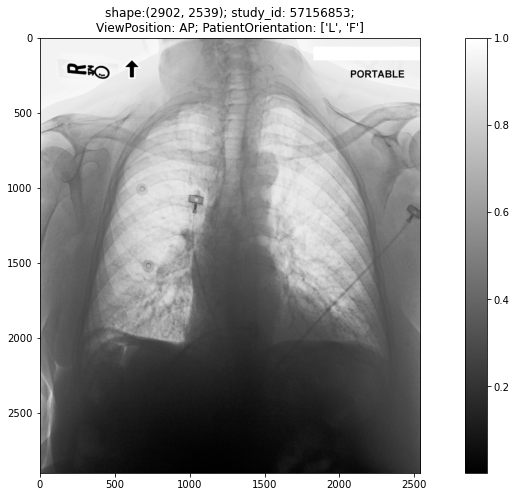

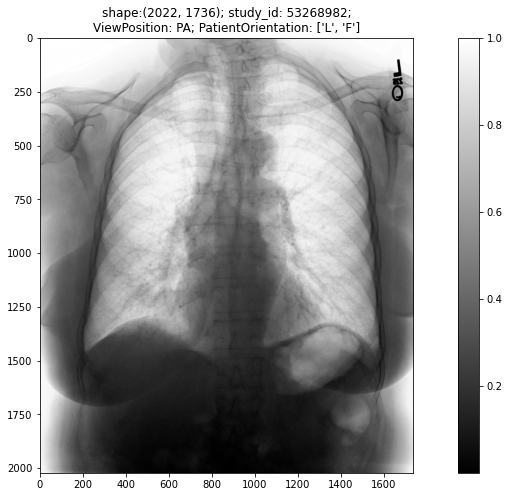

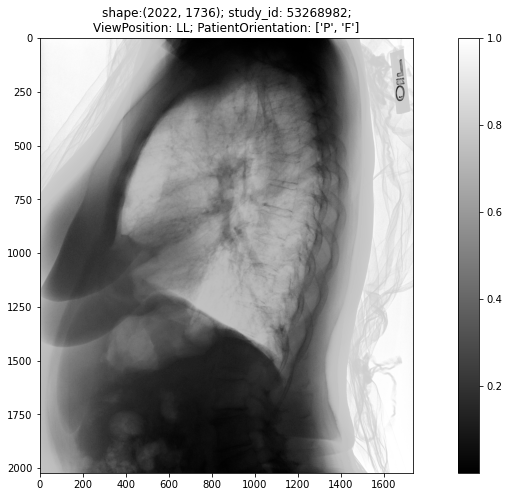

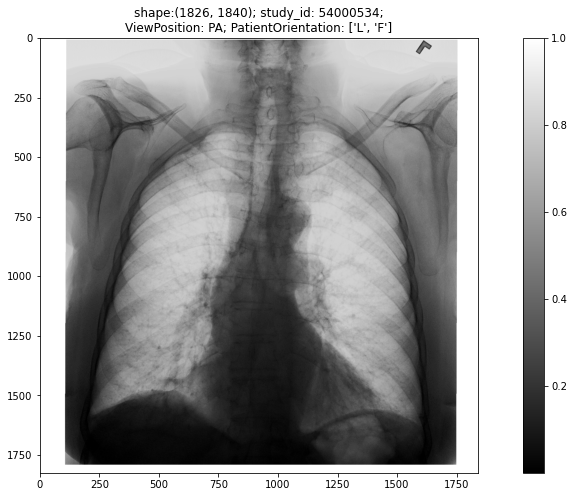

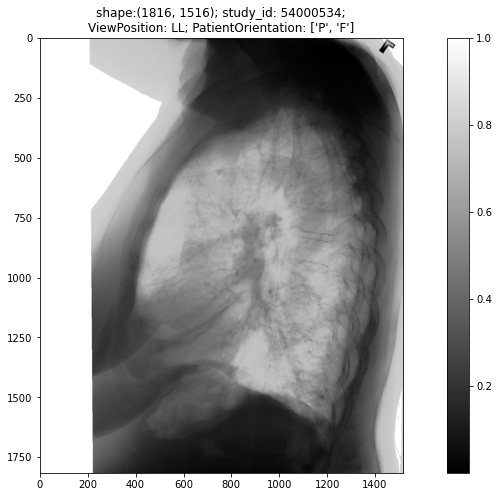

...

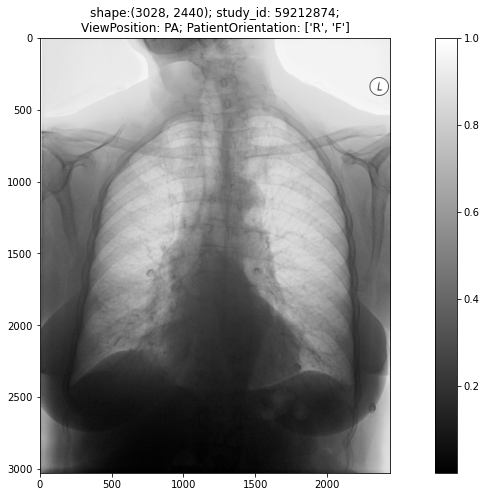

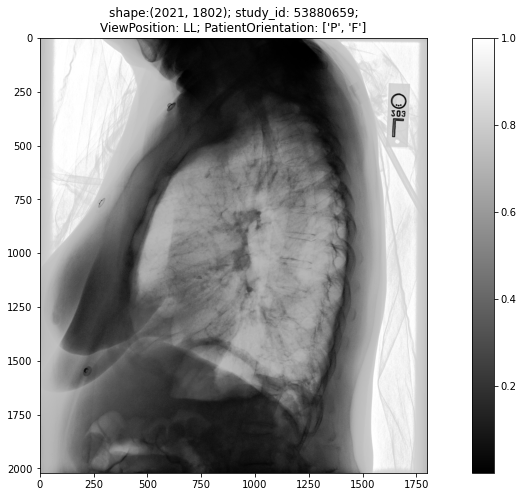

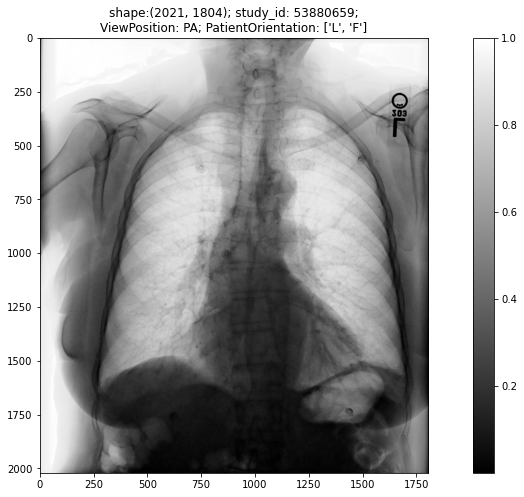

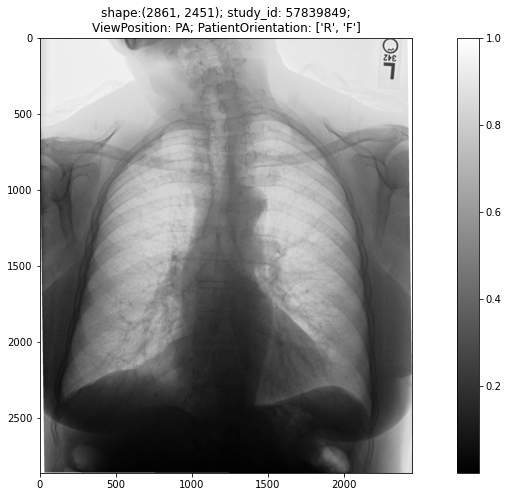

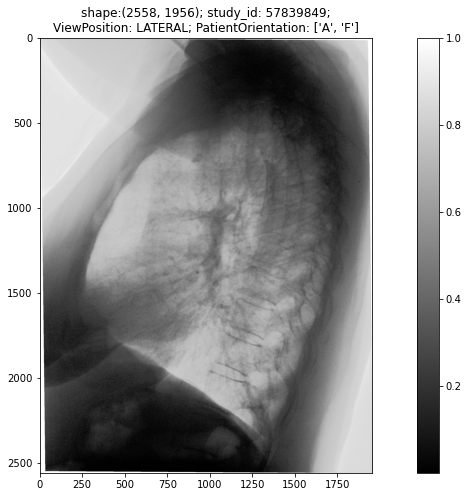

In [388]:
for study in ds[subj_id]:
    for im in study:
        imshow(
            im.image,
            title=f"shape:{im.image.shape}; study_id: {study.id};\nViewPosition: {im.meta['ViewPosition']}; PatientOrientation: {im.meta['PatientOrientation']}"
        )

In [371]:
for key in study[1].meta:
    if study[1].meta[key] != study[0].meta[key]:
        print(key)
        print(study[1].meta[key], study[0].meta[key])
        print()

IndexError: list index out of range

In [396]:
for subject in ds:
    for study in subject:
        for i, im in enumerate(study.images):
            print(study.id, i)
            print(im.image.shape)
            fig = imshow(
                im.image,
                title=f"shape:{im.image.shape}; study_id: {study.id};\nViewPosition: {im.meta['ViewPosition']}; PatientOrientation: {im.meta['PatientOrientation']}"
            )
            plt.savefig(f'./aux/s{im.study_id}_i{im.id}.png')
            plt.close(fig)

50414267 0
(2504, 2336)
50414267 1
(2644, 2152)
53189527 0
(3052, 2496)
53189527 1
(3048, 2464)
56699142 0
(2794, 2544)
53911762 0
(2847, 2195)
53911762 1
(2640, 2539)
57375967 0
(2200, 3052)
57375967 1
(3052, 2540)
57375967 2
(3052, 2536)
50771383 0
(2189, 3052)
50771383 1
(2746, 2488)
54205396 0
(2987, 2254)
54205396 1
(2964, 2540)
54205396 2
(2537, 2544)
50578979 0
(2748, 2346)
56164612 0
(2257, 2205)
56164612 1
(2030, 2586)
56522600 0
image: 6fa5997e-b1dfecf8-3c174666-8815c84a-32db59ff; study_id: 56522600; KeyError: CollimatorUpperHorizontalEdge
(2022, 1736)
56522600 1
image: f1adcae3-2921c0a8-5d9652f9-4191ecd7-f2a96f35; study_id: 56522600; KeyError: CollimatorUpperHorizontalEdge
(2022, 1736)
58219844 0
(2588, 2544)
51178377 0
(2718, 2005)
51178377 1
(2071, 2529)
55697293 0
image: 50494f1-90e2bff5-e9189550-1a4562fd-6ab5204; study_id: 55697293; KeyError: CollimatorUpperHorizontalEdge
(2022, 1840)
55697293 1
image: 6a5c3985-7764bdd0-ec5a6a74-af78bcaa-4ca33ec3; study_id: 55697293; Key

58658824 1
image: 12622d34-1a419a0d-6809a110-318f0fb1-eb8635e6; study_id: 58658824; KeyError: CollimatorUpperHorizontalEdge
(1750, 1386)
59659695 0
(2972, 2424)
57064083 0
(3056, 2328)
58581921 0
image: 61e718b7-5e69fae3-b75fc103-ee2b065d-983557f5; study_id: 58581921; KeyError: CollimatorUpperHorizontalEdge
(2140, 1760)
58581921 1
image: 6737d541-05132323-56ebc280-232a4dcf-4c996927; study_id: 58581921; KeyError: CollimatorUpperHorizontalEdge
(2140, 1760)
58581921 2
image: 917c7e6f-65034e28-593fb631-d742d472-d141b2; study_id: 58581921; KeyError: CollimatorUpperHorizontalEdge
(2140, 1760)
58838312 0
(2715, 2368)
50027225 0
(3052, 2540)
57961288 0
(2852, 2348)
57961288 1
(3016, 2500)
56100138 0
(3024, 2492)
56100138 1
(2260, 2380)
55758034 0
(3052, 2508)
59414737 0
(3052, 2540)
59891001 0
(3000, 2544)
50292543 0
(3052, 2540)
57321224 0
(3008, 2476)
57321224 1
(3000, 2512)
57884847 0
image: 741bad-69c65de9-b4380a37-e22c7291-a15eccf0; study_id: 57884847; KeyError: CollimatorUpperHorizontalE

50691028 0
(3032, 2540)
50691028 1
(2868, 2540)
59581256 0
image: 28100fe4-a1120f36-8cf2f843-ffbc3edd-9e337f7a; study_id: 59581256; KeyError: CollimatorUpperHorizontalEdge
(2022, 1866)
59581256 1
image: 204a16f3-7d7fcafa-f384278f-57c73614-61350537; study_id: 59581256; KeyError: CollimatorUpperHorizontalEdge
(2021, 1821)
53950795 0
(3020, 2539)
50611575 0
image: be0031db-71027bcc-0fb3a0fa-71fddcaf-8b8a89b7; study_id: 50611575; KeyError: CollimatorUpperHorizontalEdge
(2022, 1736)
50611575 1
image: 124b0f6e-0e28de07-78df65f2-c9e14867-2a6477f4; study_id: 50611575; KeyError: CollimatorUpperHorizontalEdge
(1956, 1450)
56689183 0
(2872, 2539)
57426090 0
(3052, 2540)
54510564 0
(2811, 2524)
54060141 0
(3020, 2540)
54060141 1
(3040, 2540)
57249718 0
(2904, 2472)
57249718 1
(2992, 2204)
58865310 0
(3008, 2492)
58865310 1
(3008, 2480)
59735352 0
image: 74310bf1-d27a962d-9172dadc-3928d076-d5c31958; study_id: 59735352; KeyError: CollimatorUpperHorizontalEdge
(2022, 1736)
59735352 1
image: 0fabcc0-d

52421847 1
image: a6ac937d-e20e19bc-c222e39c-cfdd23a2-47f72454; study_id: 52421847; KeyError: CollimatorUpperHorizontalEdge
(1865, 1782)
54471901 0
(2596, 2539)
55814288 0
(3056, 2544)
55814288 1
(2672, 2383)
58253009 0
(2870, 2291)
58253009 1
(2737, 2364)
53604298 0
(3056, 2404)
53604298 1
(2992, 2392)
53604298 2
(3056, 2404)
57317530 0
image: 53b86975-e4fe3f2e-0ea55a4b-e1e24a2e-a4419374; study_id: 57317530; KeyError: CollimatorUpperHorizontalEdge
(2022, 1596)
57317530 1
image: 1a3523e4-ad21e0a2-44778871-d6b31843-d2d71dc2; study_id: 57317530; KeyError: CollimatorUpperHorizontalEdge
(1956, 1730)
56511682 0
(2322, 2495)
54026364 0
(3036, 2476)
54026364 1
(2576, 2488)
50139454 0
image: 3fe41a3-82c1823a-c89126fc-6847de95-b70a6d28; study_id: 50139454; KeyError: CollimatorUpperHorizontalEdge
(2140, 1760)
50139454 1
image: 319b0e8d-a6ce8940-e4b9bbeb-38c53c0a-adc35647; study_id: 50139454; KeyError: CollimatorUpperHorizontalEdge
(2140, 1760)
52123095 0
image: 91b65c9-3497145d-bbdaf128-f9b3f62f

57344954 0
(2535, 2796)
55477990 0
(2539, 2719)
52971110 0
(2484, 3052)
52971110 1
(2540, 3052)
52971110 2
(3052, 2540)
50713146 0
(2537, 2645)
54251554 0
(2457, 2540)
52620675 0
image: 45b286df-437029e0-7393072d-42773f80-def47e3; study_id: 52620675; KeyError: CollimatorUpperHorizontalEdge
(2021, 1794)
52620675 1
image: 62130613-2235fd5f-eb8faeb6-e3a84169-c1924aa6; study_id: 52620675; KeyError: CollimatorUpperHorizontalEdge
(2021, 1773)
52359357 0
image: 23d49a64-2ea7d41e-a80f526b-f9cbc879-371ab358; study_id: 52359357; KeyError: CollimatorUpperHorizontalEdge
(2021, 1788)
52359357 1
image: 5f090a4b-dc8a796d-726db5a0-62f19c9f-58cccd6f; study_id: 52359357; KeyError: CollimatorUpperHorizontalEdge
(2021, 1761)
56014224 0
image: 4634bba5-dc3eb3e4-bf2735fd-ae963c1c-efcd994; study_id: 56014224; KeyError: CollimatorUpperHorizontalEdge
(1970, 1422)
56014224 1


AttributeError: 'FileDataset' object has no attribute 'RescaleSlope'

In [398]:
st = ds.get_study(56014224)

In [403]:
st[1]

MIMIC_CXR_DICOM_Image filepath: /ws/rif-net/data/origin/mimic-cxr-2.0.0/files/p10/p10014729/s56014224/88dafe55-01c83959-477aa6f5-0c37f527-9061de52.dcm
    pixel_spacing: [0.20, 0.20]
    image: not loaded, call `image` attr to load
        

In [404]:
dcm = pydicom.dcmread("/ws/rif-net/data/origin/mimic-cxr-2.0.0/files/p10/p10014729/s56014224/88dafe55-01c83959-477aa6f5-0c37f527-9061de52.dcm")

In [411]:
dcm

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 204
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: Computed Radiography Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 2.25.181912086608893984490577554026880562471
(0002, 0010) Transfer Syntax UID                 UI: Explicit VR Little Endian
(0002, 0012) Implementation Class UID            UI: 2.25.55362949469033348352269585565668676650
(0002, 0013) Implementation Version Name         SH: 'MIMIC-CXR v2.0.0'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0008) Image Type                          CS: ['DERIVED', 'PRIMARY', 'POST_PROCESSED', '', '', '', '', '', '100000']
(0008, 0016) SOP Class UID                       UI: Computed Radiography Image Storage
(0008, 0018) SOP Instance UID                    UI: 2.25.18191208

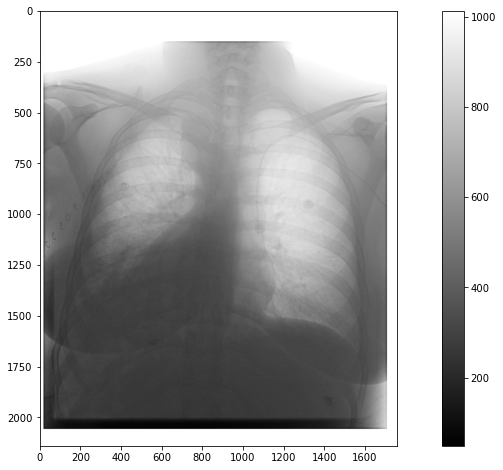

In [410]:
imshow(dcm.pixel_array);

In [22]:
df_chexpert = pd.read_csv(DATAPATH + "mimic-cxr-2.0.0-chexpert.csv")

In [23]:
df_chexpert['subject_id'] = df_chexpert['subject_id'].apply(lambda x: str(x))

In [24]:
df10_chexpert = df_chexpert[df_chexpert['subject_id'].apply(lambda x: x.startswith('10'))]

In [25]:
df10_chexpert[df10_chexpert["Pneumonia"] == -1.0]

,subject_id,study_id,Atelectasis,Cardiomegaly,Consolidation,Edema,Enlarged Cardiomediastinum,Fracture,Lung Lesion,Lung Opacity,No Finding,Pleural Effusion,Pleural Other,Pneumonia,Pneumothorax,Support Devices
4,10000764,57375967,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,NaN,NaN
8,10000935,51178377,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,-1.0,NaN,NaN
16,10000980,54935705,NaN,NaN,-1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.0,NaN,NaN
44,10001884,53268982,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,-1.0,NaN,NaN
53,10001884,56308417,-1.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,-1.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22166,10998537,58187018,NaN,NaN,NaN,1.0,NaN,NaN,NaN,1.0,NaN,NaN,NaN,-1.0,NaN,NaN
22172,10998936,54075097,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,-1.0,NaN,NaN
22173,10998936,54167675,-1.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,-1.0,NaN,NaN
22184,10999395,54669058,-1.0,1.0,NaN,-1.0,NaN,NaN,NaN,1.0,NaN,NaN,NaN,-1.0,NaN,NaN


In [27]:
df10_chexpert[df10_chexpert["study_id"] == 51967283]

,subject_id,study_id,Atelectasis,Cardiomegaly,Consolidation,Edema,Enlarged Cardiomediastinum,Fracture,Lung Lesion,Lung Opacity,No Finding,Pleural Effusion,Pleural Other,Pneumonia,Pneumothorax,Support Devices
14,10000980,51967283,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN


In [396]:
df10_chexpert.groupby("Pneumonia").count()

,subject_id,study_id,Atelectasis,Cardiomegaly,Consolidation,Edema,Enlarged Cardiomediastinum,Fracture,Lung Lesion,Lung Opacity,No Finding,Pleural Effusion,Pleural Other,Pneumothorax,Support Devices
Pneumonia,,,,,,,,,,,,,,,
-1.0,1813,1813,811,493,382,779,246,33,106,1321,0,799,36,377,477
0.0,2303,2303,486,1025,76,1305,192,64,77,297,898,1205,52,332,517
1.0,1572,1572,492,480,397,580,170,17,78,901,0,717,29,278,425


In [405]:
df10_chexpert["Pneumonia"].value_counts()

 0.0    2303
-1.0    1813
 1.0    1572
Name: Pneumonia, dtype: int64

In [410]:
df10_chexpert.columns[2:]

Index(['Atelectasis', 'Cardiomegaly', 'Consolidation', 'Edema',
       'Enlarged Cardiomediastinum', 'Fracture', 'Lung Lesion', 'Lung Opacity',
       'No Finding', 'Pleural Effusion', 'Pleural Other', 'Pneumonia',
       'Pneumothorax', 'Support Devices'],
      dtype='object')

In [413]:
for column in df10_chexpert.columns[2:]:
    print(column, '\n', df10_chexpert[column].value_counts(), "\n\n")

Atelectasis 
  1.0    4535
-1.0    1008
 0.0     130
Name: Atelectasis, dtype: int64 


Cardiomegaly 
  1.0    4493
 0.0    1472
-1.0     623
Name: Cardiomegaly, dtype: int64 


Consolidation 
  1.0    1098
 0.0     755
-1.0     389
Name: Consolidation, dtype: int64 


Edema 
  1.0    2614
 0.0    2520
-1.0    1310
Name: Edema, dtype: int64 


Enlarged Cardiomediastinum 
 -1.0    914
 1.0    695
 0.0    499
Name: Enlarged Cardiomediastinum, dtype: int64 


Fracture 
  1.0    464
 0.0     80
-1.0     49
Name: Fracture, dtype: int64 


Lung Lesion 
  1.0    614
-1.0     97
 0.0     84
Name: Lung Lesion, dtype: int64 


Lung Opacity 
  1.0    5009
-1.0     387
 0.0     294
Name: Lung Opacity, dtype: int64 


No Finding 
 1.0    7267
Name: No Finding, dtype: int64 


Pleural Effusion 
  1.0    5311
 0.0    2612
-1.0     572
Name: Pleural Effusion, dtype: int64 


Pleural Other 
  1.0    222
-1.0     76
 0.0     17
Name: Pleural Other, dtype: int64 


Pneumonia 
  0.0    2303
-1.0    1813
 